In [1]:
# Install packages

#using Pkg
#Pkg.add("Distributions")
#Pkg.add("AlphaStableDistributions")
#Pkg.add("Statistics")
#Pkg.add("Plots")
#Pkg.add("StatsPlots")

In [2]:
using Distributions
using AlphaStableDistributions
using Statistics

# Non-hierarchical levy flight Simulator

Parameters

•	a = threshold separation; 

•	zr = relative starting point;

•	v0 = drift rate for blue stimuli or non-word stimuli;

•	v1 = drift rate for orange stimuli or word stimuli; 

•	t0 = non-decisional time; 

•	alpha = stability parameter of noise distribution; 

•	sz = across-trial variability in starting point; 

•	sv = across-trial variability in drift rate;

•	st = across-trial variability in non-decisional processes 



Other Stuff

•	dt = granularity of time steps

•	tol = maximum number of time steps

•	rho = ?

•	beta = skewness of the levy distribution (always 0 in our use case?)

In [3]:
# First draft without intertrial variability params

function generate_levy_trial(a::Float64, zr::Float64, v::Float64, t0::Float64, alpha::Float64, beta::Float64, dt=0.001, tol=1e5)
    n_steps = 0 # start at time 0
    x = zr # start evidence accumulation process at relative starting point; unnecessary?
    rho = dt ^ (1.0/alpha) # Scaling factor -> how far into the trial is the current step

    while (x < a) && (x > 0) && (n_steps < tol) # as long as no decision boundary or the max. amount of steps is reached
        x += dt*v + rho * rand(AlphaStable(α=alpha, β=beta, scale=1.0, location=0.0))
        n_steps += 1
    end
    
    return [dt*n_steps + t0, x > 0 ? 1.0 : 0.0] # reaction time, decision 
end


generate_levy_trial (generic function with 3 methods)

In [4]:
# Test
#generate_levy_trial(a=1.0, zr=0.5, v=2.0, t0=0.5, alpha=2.0, beta=0.0) # Julia seems to dislike keywords without defaults
generate_levy_trial(1.0, 0.5, 2.0, 0.5, 2.0, 0.0);

In [5]:
"Generates reaction time data from a partipant according to a diffusion model."
function generate_levy_participant(n_trials::Int64, a::Float64, zr::Float64, v0::Float64, v1::Float64, t0::Float64, alpha::Float64, beta::Float64)::Array{Float64, 2}
    # discriminate between stimulus type / v0 and v1 here!

    data = fill(0.0, (n_trials, 3))
    stimulus_type = rand(Bernoulli(0.5), n_trials) # sample stimulus type
    data[:, 1] = stimulus_type

    for n in 1:n_trials

        if stimulus_type[n] == false # blue / non-word
            data[n, 2:3] = generate_levy_trial(a, zr, v0, t0, alpha, beta)
        else # orange / word
            data[n, 2:3] = generate_levy_trial(a, zr, v1, t0, alpha, beta)
        end
        
    end
    
    return data # stimulus_type, rt, decision
end

generate_levy_participant

In [6]:
# Test
generate_levy_participant(100, 1.0, 0.5, -2.0, 2.0, 0.5, 2.0, 0.0);

In [7]:
"Generates reaction times of a participant in two conditions (color discrimination & lexical decision)."
function generate_levy_conditions(a::Float64, zr::Float64, v0::Float64, v1::Float64, t0::Float64, alpha::Float64, beta::Float64)::Array{Float64, 2}

    color_trials = 500 # 5 blocks a 100 trials
    lexical_trials = 400 # 4 blocks a 100 trials

    data_c = fill(0.0, (color_trials, 3)) # unnecessary?
    data_l = fill(0.0, (lexical_trials, 3))

    data_c = generate_levy_participant(color_trials, a, zr, v0, v1, t0, alpha, beta)
    data_l = generate_levy_participant(lexical_trials, a, zr, v0, v1, t0, alpha, beta)

    block_sequence = rand(Bernoulli(0.5), 1)

    if block_sequence == false # first color, then lexical
        data = vcat(data_c, data_l)
    else # first lexical, then color
        data = vcat(data_l, data_c)
    end

    return data
end


generate_levy_conditions

In [8]:
# Test
generate_levy_conditions(1.0, 0.5, -2.0, 2.0, 0.5, 2.0, 0.0);

In [ ]:
"Draws parameter values from the specified prior distributions."
function generate_levy_priors() #TODO

    # a (threshold separation)
    mu_a =
    sigma_a = 
    a_l = 

    # zr (relative starting point)
    mu_zr =
    sigma_zr = 
    zr_l = 

    # v0 (drift rate for blue stimuli or non-word stimuli)
    mu_v0 =
    sigma_v0 = 
    v0_l = 

    # v1 (drift rate for orange stimuli or word stimuli)
    mu_v1 =
    sigma_v1 = 
    v1_l = 

    # t0 (non-decisional time)
    mu_t0 =
    sigma_t0 = 
    t0_l = 

    # alpha (stability parameter of noise distribution)
    mu_alpha =
    sigma_alpha = 
    alpha_l = 

    # intertrial variabilities
    sz =
    sv =
    st = 

In [9]:
"Generates reaction time datasets according to the four models in Wieschen, Voss and Radev (2020)."
function generate_levy_dataset_by_model(model::Int, n_clusters::Int64)::Array{Float64, 3}
    # TODO: add sv st sz

    n_trials = 900
    data = fill(0.0, (n_clusters, n_trials, 3))

    for k in 1:n_clusters
        a, zr, v0, v1, t0, alpha, beta = [1, 0.5, -2, 2, 0.5, 1.5, 0.0] # TODO: add generate_levy_priors here to replace fixed params
 
        if model == 1 || model == 3 # Gaussian noise
            alpha = 2.0
        end

        #if model = 1 || model = 2 # Basic instead of full diffusion model
        #    sz = sv = st = 0.0 # Correct assignment?
        #end

        data[k, :, :] = generate_levy_conditions(a, zr, v0, v1, t0, alpha, beta)
    end

    return data
end

generate_levy_dataset_by_model

In [10]:
# Test
generate_levy_dataset_by_model(4, 40);

In [11]:
"Generates a batch of datasets simulated from different models." # overkill as we only have one batch where we simulate once from each model but why not
function generate_levy_batch(n_models::Int64, batch_size::Int64, n_clusters::Int64, n_trials::Int64)#::Array{Float64, 4}

    data = fill(0.0, (batch_size, n_clusters, n_trials, 3))

    base_model_indices = collect(1:n_models)
    batch_model_indices = sample(base_model_indices, batch_size)

    Threads.@threads for b in 1:batch_size
        data[b, :, :, :] = generate_levy_dataset_by_model(batch_model_indices[b], n_clusters)
    end

    return batch_model_indices, data
end

generate_levy_batch

In [12]:
# Test with 2 batches
generate_levy_batch(4, 2, 40, 900);

In [80]:
# TODO: add s params -> pushforward checks -> prior implementation -> pushforward checks

In [ ]:
# Schrittweise alles plotten: erst priors plotten, dann likelihood: RTs / accuracies nach Condition plotten

## Pushforward checks

In [220]:
# Simulate 
n_models = 2
batch_size = 20
n_clusters = 40
n_trials = 900

test_batch_indices, test_batch_data = generate_levy_batch(n_models, batch_size, n_clusters, n_trials);

In [227]:
# Split batches by data generating model
test_batch_data_m1 = test_batch_data[test_batch_indices.==1,:,:,:];
test_batch_data_m2 = test_batch_data[test_batch_indices.==2,:,:,:];

model_batches = [test_batch_data_m1, test_batch_data_m2];

In [230]:
# Mean RTs
for m in model_batches
    println(mean(m[:, :, :, 2]))
end

0.6272832621527777
0.6948324930555556


In [231]:
# Accuracies
for m in model_batches
    println(sum(m[:, :, :, 1] .== m[:, :, :, 3])/length(m[:, :, :, 1]))
end

0.7408298611111112
0.8455416666666666


# Plot Levy distributions

In [87]:
function plot_levy_trial(a::Float64, zr::Float64, v::Float64, t0::Float64, alpha::Float64, beta::Float64, dt=0.001, tol=1e5)
    n_steps = 0 # start at time 0
    x = zr # start evidence accumulation process at relative starting point; unnecessary?
    rho = dt ^ (1.0/alpha) # WHAT EXACTLY DOES RHO STAND FOR?

    d=Any[]
    while (x < a) && (x > 0) && (n_steps < tol) # as long as no decision boundary or the max. amount of steps is reached
        x += dt*v + rho * rand(AlphaStable(α=alpha, β=beta, scale=1.0, location=0.0)) # location 0, scale 1
        push!(d,x)
        n_steps += 1
    end
    
    return d # reaction time, decision 
end

plot_levy_trial (generic function with 3 methods)

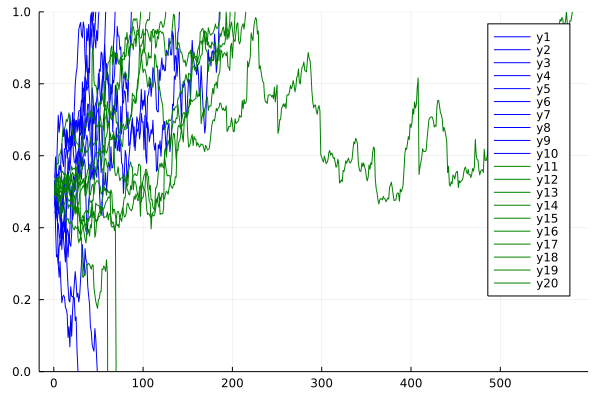

In [183]:
# Plot single trials: Gaussian vs. Levy (alpha=1.5) noise
using Plots

normal_data = Any[]
for i in 1:10
    trial = plot_levy_trial(1.0, 0.5, 2.0, 0.5, 2.0, 0.0)
    push!(normal_data, trial)
end

levy_data = Any[]
for i in 1:10
    trial = plot_levy_trial(1.0, 0.5, 2.0, 0.5, 1.5, 0.0)
    push!(levy_data, trial)
end

plot(normal_data, color="blue", ylims=(0, 1))
plot!(levy_data, color="green")


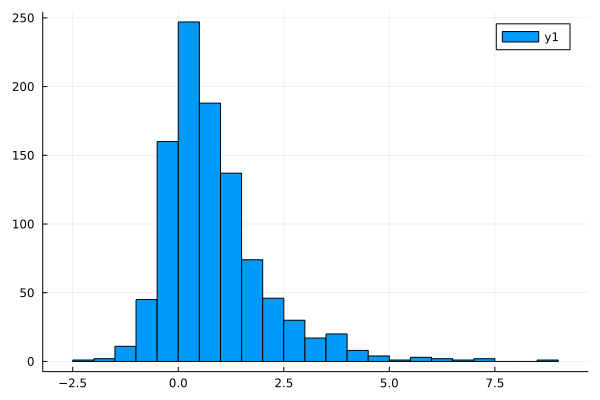

In [67]:
# Whats the role of inverse Gaussian?!

histogram(rand(NormalInverseGaussian(0, 1.5, 1.0, 1), 1000))

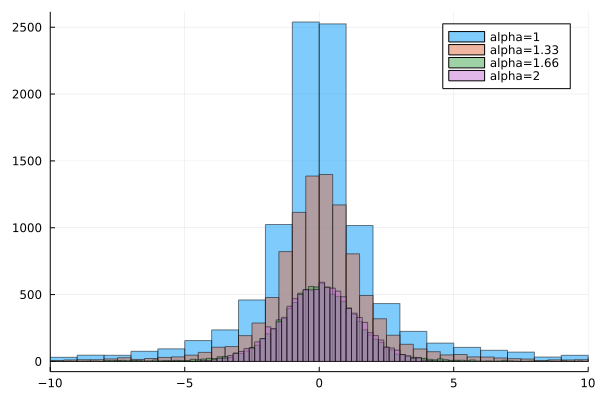

In [203]:
# Plot alpha stable dist for different values of alpha (varying heavyness of tails)

histogram(rand(AlphaStable(α=1.0, β=0.0, scale=1.0, location=0.0), 10000), alpha=0.5, xlims=(-10, 10), label="alpha=1")
histogram!(rand(AlphaStable(α=1.33, β=0.0, scale=1.0, location=0.0), 10000), alpha=0.5, label="alpha=1.33")
histogram!(rand(AlphaStable(α=1.66, β=0.0, scale=1.0, location=0.0), 10000), alpha=0.5, label="alpha=1.66")
histogram!(rand(AlphaStable(α=2.0, β=0.0, scale=1.0, location=0.0), 10000), alpha=0.5, label="alpha=2")

# Hierarchical Normal Simulator - Generates a single hierarchical dataset

In [ ]:
"Draws parameter values from the specified prior distributions of the hyperprior and the conditional prior."
function draw_from_prior()

In [ ]:
"Generates a single hierarchical dataset from the sampled parameter values."
function gen_from_likelihood()

In [ ]:
"Generates a single hierarchical dataset utilizing the draw_from_prior and gen_from_likelihood functions."
function generate_single()
        # see levy_batch?

# Main Simulator - Generates a batch of hierarchical datasets

In [ ]:
"Creates the sequence of models to be simulated from in the batch."
function draw_from_model_prior()

In [ ]:
"Simulates a batch of hierarchical datasets."
function simulate()